<a href="https://colab.research.google.com/github/Diwakar-Gupta/Data-Science-APRIL/blob/main/22-05-07-End-To-End/Codes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



*   Understand Bussiness problem
*   Get the Data
*   Visualize, EDA
    *   AutoViz
*   feature engineering
*   Pre-processing, prepare data for machine learning algo (cleaning, text, scaling)
*   pipeline
*   select and train model
    *   Train_test_split
*   Evaluate
    *   MSE
    *   RMSE
*   fine tuning
    *   Grid Search
    *   Randomized Search
    *   Halving Search

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Get the Data

In [6]:
df = pd.read_csv('https://raw.githubusercontent.com/mohitgupta-omg/Kaggle-California-Housing-Prices/master/Data/housing.csv')
df.sample(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
14505,-117.22,32.86,4.0,16289.0,4585.0,7604.0,4176.0,3.6287,280800.0,NEAR OCEAN
931,-122.04,37.54,26.0,2145.0,369.0,1285.0,377.0,4.9464,223800.0,NEAR BAY
4412,-118.25,34.08,44.0,1425.0,438.0,1121.0,374.0,2.1108,200000.0,<1H OCEAN
5516,-118.39,33.97,38.0,993.0,175.0,374.0,180.0,6.2673,357200.0,<1H OCEAN
12708,-121.38,38.59,36.0,1239.0,237.0,764.0,222.0,3.0156,103000.0,INLAND


In [3]:
# missing data

df.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [4]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


# Visualization

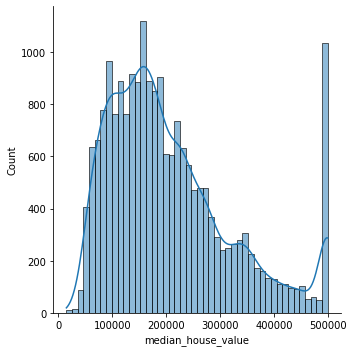

In [8]:
sns.displot(data=df, x='median_house_value', kde=True)

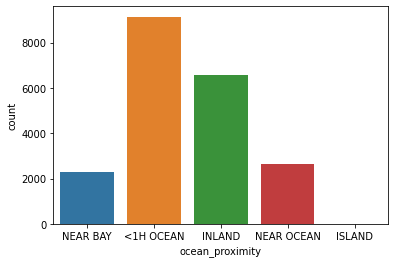

In [10]:
sns.countplot(data=df, x='ocean_proximity', )

In [11]:
df['ocean_proximity'].value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

In [12]:
import plotly.express as px

px.box(df, x='ocean_proximity', y='median_house_value')

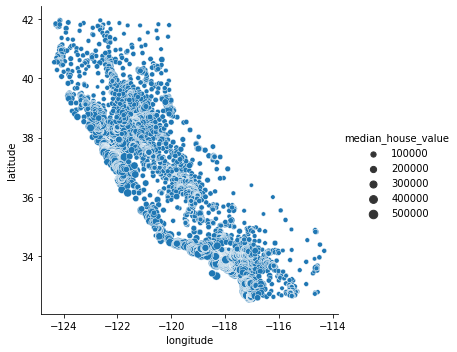

In [20]:
sns.relplot(data=df, x='longitude', y='latitude', kind='scatter', size='median_house_value', palette='jet')

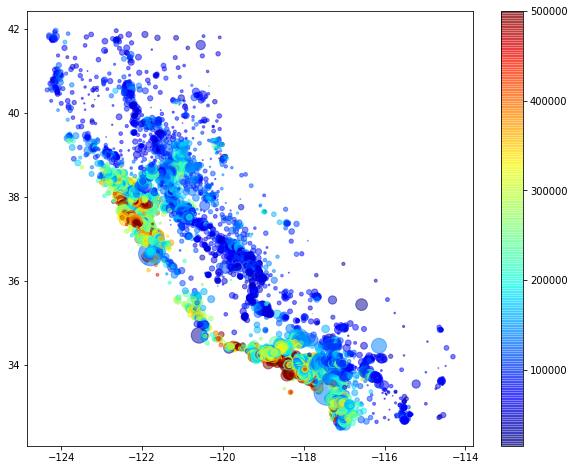

In [23]:
plt.figure(figsize = (10, 8))

plt.scatter(df['longitude'], df['latitude'], c = df['median_house_value'], s=df['population']/50, alpha=0.5, cmap='jet')
plt.colorbar()

plt.show()

In [24]:
! pip install autoviz

     |████████████████████████████████| 62 kB 590 kB/s 
     |████████████████████████████████| 3.1 MB 15.9 MB/s 
     |████████████████████████████████| 136 kB 42.6 MB/s 
     |████████████████████████████████| 11.2 MB 37.4 MB/s 
     |████████████████████████████████| 18.5 MB 748 kB/s 
     |████████████████████████████████| 1.7 MB 49.7 MB/s 
     |████████████████████████████████| 175 kB 77.6 MB/s 
     |████████████████████████████████| 12.9 MB 20.9 MB/s 
     |████████████████████████████████| 930 kB 54.8 MB/s 
  Created wheel for emoji: filename=emoji-1.7.0-py3-none-any.whl size=171046 sha256=2aa2a113d694fbeeca0e3aece3d656db81bf0db7d59c2b7f505f6c0b7ba5bbef
  Stored in directory: /root/.cache/pip/wheels/8a/4e/b6/57b01db010d17ef6ea9b40300af725ef3e210cb1acfb7ac8b6
Successfully built emoji
  Attempting uninstall: bokeh
    Found existing installation: bokeh 2.3.3
    Uninstalling bokeh-2.3.3:
      Successfully uninstalled bokeh-2.3.3
  Attempting uninstall: panel
    Found existing 

Alert! from version 0.1.39, fter importing, you must do '%matplotlib inline' to display charts in Jupyter Notebooks.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Updated: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
      chart_format='html' silently saves charts HTML format - they are also interactive!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
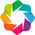

Shape of your Data Set loaded: (20640, 10)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    10 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 45
Time to run AutoViz = 8 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


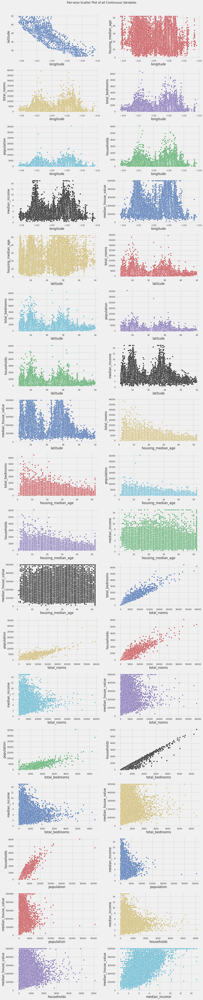

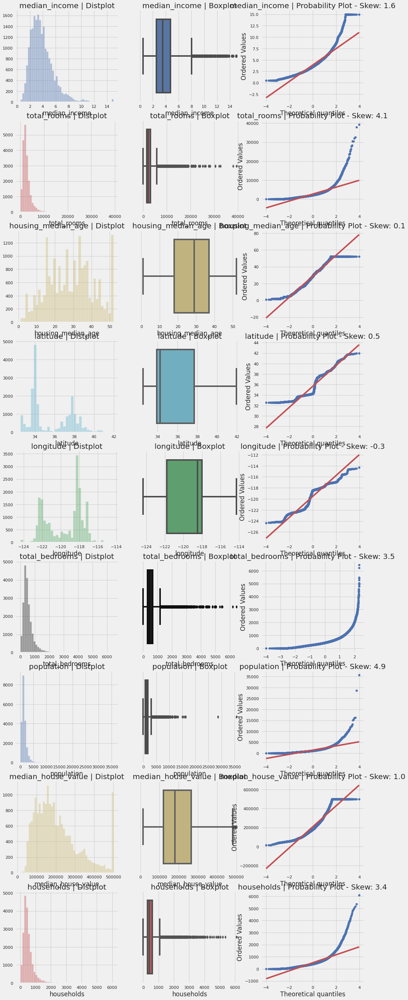

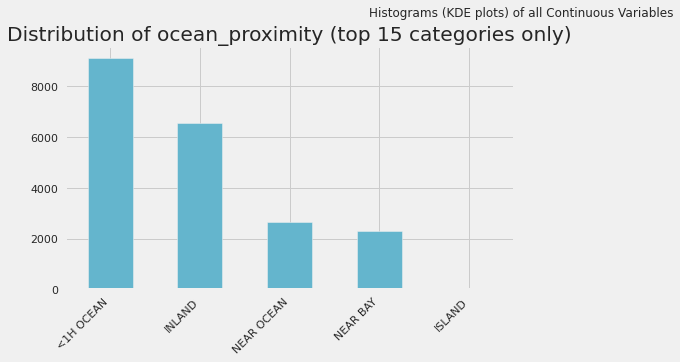

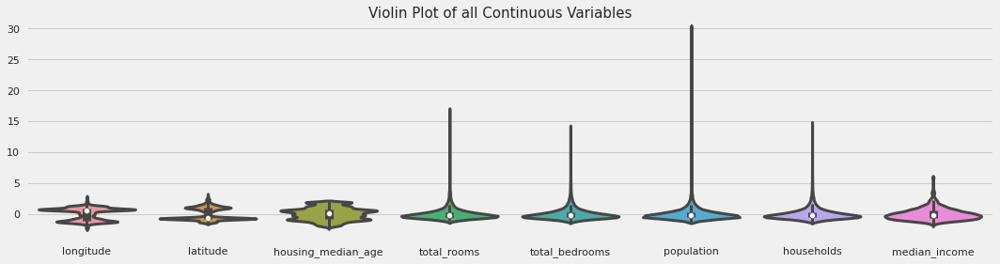

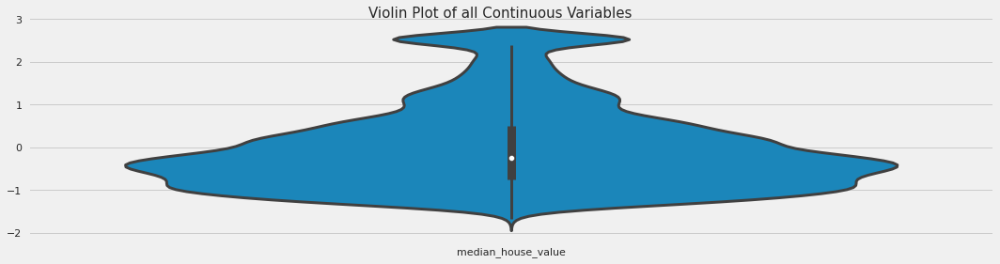

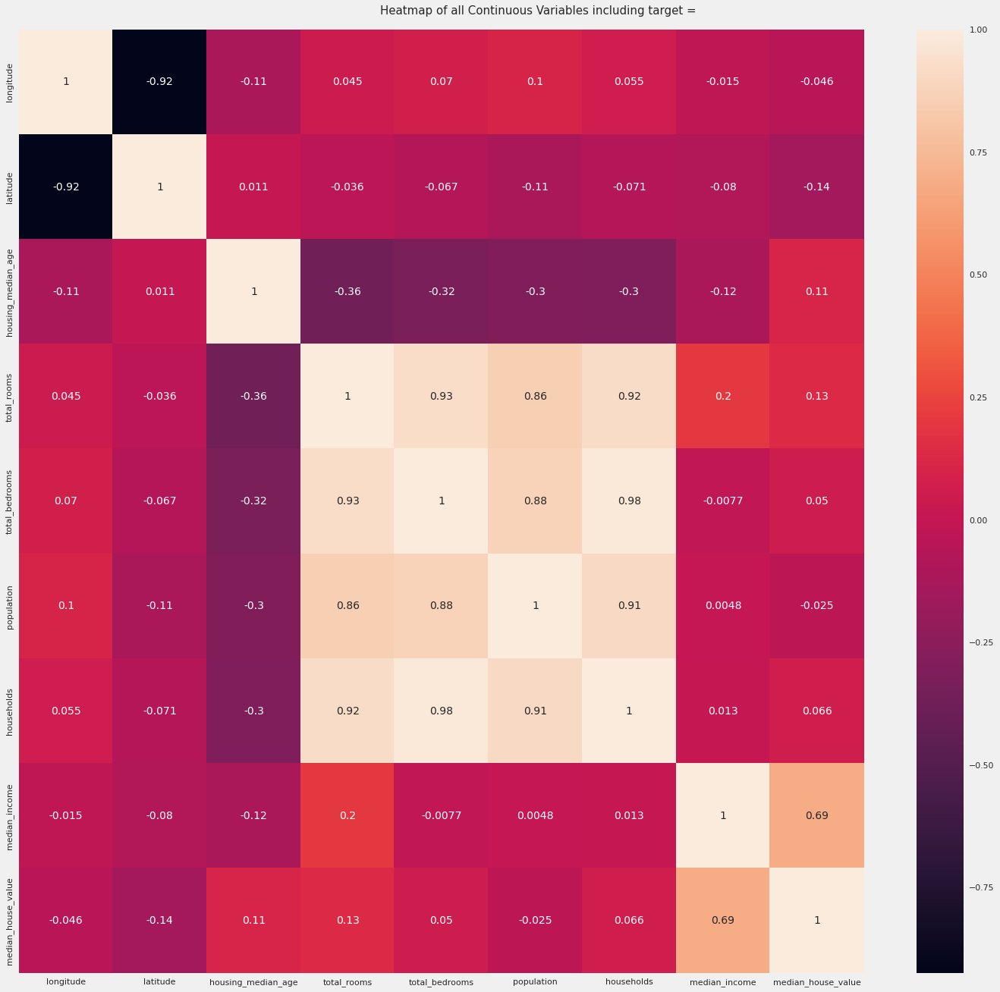

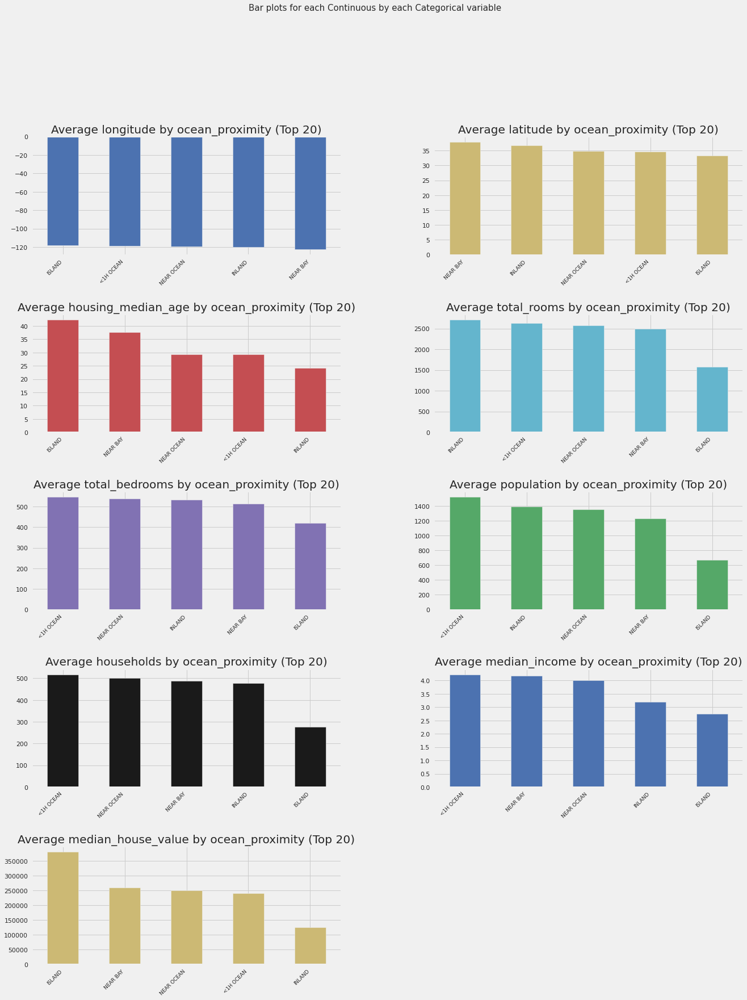

In [25]:
from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()

filename = ""
sep = ","
dft = AV.AutoViz(
    filename,
    sep=",",
    depVar="",
    dfte=df,
    header=0,
    verbose=0,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None
)

# Feature engineering

In [33]:
df.corr()['median_house_value'].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.688075
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_bedrooms        0.049686
population           -0.024650
longitude            -0.045967
latitude             -0.144160
Name: median_house_value, dtype: float64

In [35]:
df['room_per_household'] = df['total_rooms'] / df['households']
df['populationperhouse'] = df['population'] / df['households']
df['bedroomperroom'] = df['total_bedrooms'] / df['total_rooms']

In [36]:
df.corr()['median_house_value'].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.688075
room_per_household    0.151948
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_bedrooms        0.049686
populationperhouse   -0.023737
population           -0.024650
longitude            -0.045967
latitude             -0.144160
bedroomperroom       -0.255880
Name: median_house_value, dtype: float64

## Missing Values



*   drop row
*   drop col
*   fill some value



In [37]:
df.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
room_per_household      0
populationperhouse      0
bedroomperroom        207
dtype: int64

In [38]:
df.sample(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,room_per_household,populationperhouse,bedroomperroom
7914,-118.08,33.88,30.0,1901.0,519.0,2685.0,496.0,3.2639,120100.0,<1H OCEAN,3.832661,5.413306,0.273014
11963,-117.41,34.01,34.0,1231.0,216.0,841.0,199.0,2.6442,92000.0,INLAND,6.185930,4.226131,0.175467
18738,-122.35,40.56,12.0,3900.0,863.0,2145.0,864.0,1.9881,85200.0,INLAND,4.513889,2.482639,0.221282
17431,-120.45,34.65,27.0,2215.0,578.0,1544.0,527.0,1.9257,135300.0,NEAR OCEAN,4.203036,2.929791,0.260948
17947,-121.96,37.33,35.0,2294.0,411.0,1054.0,449.0,4.0667,276900.0,<1H OCEAN,5.109131,2.347439,0.179163


In [42]:
print('Original ', df.shape)

print('Drop row', df.dropna().shape)
print('Drop col', df.dropna(axis=1).shape)


Original  (20640, 13)
Drop row (20433, 13)
Drop col (20640, 11)


In [46]:
median = df['total_bedrooms'].median()
df['total_bedrooms'].fillna(median, inplace=True)

In [47]:
df.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms          0
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
room_per_household      0
populationperhouse      0
bedroomperroom        207
dtype: int64

In [48]:
median = df['bedroomperroom'].median()
df['bedroomperroom'].fillna(median, inplace=True)

In [50]:
from sklearn.impute import SimpleImputer

si = SimpleImputer(strategy='median')
si.fit(df[ ['total_bedrooms', 'bedroomperroom'] ] )
si.transform(df[ ['total_bedrooms', 'bedroomperroom'] ])

array([[1.29000000e+02, 1.46590909e-01],
       [1.10600000e+03, 1.55796591e-01],
       [1.90000000e+02, 1.29516019e-01],
       ...,
       [4.85000000e+02, 2.15173026e-01],
       [4.09000000e+02, 2.19892473e-01],
       [6.16000000e+02, 2.21184919e-01]])

# Pre-Processing

## Handling Categorical Data

*  Odinal 
*  One-Hot 

In [57]:
from sklearn.preprocessing import OrdinalEncoder

order_oceam_proximity = ['INLAND', '<1H OCEAN', 'NEAR OCEAN', "NEAR BAY", "ISLAND"]
oe = OrdinalEncoder( categories = [order_oceam_proximity] )

oe.fit( df[ ['ocean_proximity'] ] )
oe.transform( df[ ['ocean_proximity'] ] )

array([[3.],
       [3.],
       [3.],
       ...,
       [0.],
       [0.],
       [0.]])

In [61]:
from sklearn.preprocessing import OneHotEncoder

oh = OneHotEncoder()

oh.fit( df[ ['ocean_proximity'] ] )
oh.transform( df[ ['ocean_proximity'] ] ).toarray()

array([[0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0.],
       ...,
       [0., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0.]])

## Scaling



*   Min-Max [0, 1]
*   Standard Scalar `mean=0, var=1`



In [63]:
df.drop(columns=['ocean_proximity']).sample(2)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,room_per_household,populationperhouse,bedroomperroom
9993,-121.12,39.03,17.0,838.0,161.0,388.0,142.0,3.6563,163500.0,5.901408,2.732394,0.192124
14593,-117.18,32.83,27.0,2346.0,399.0,1105.0,373.0,4.2708,182800.0,6.289544,2.962466,0.170077


In [65]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
ss.fit(df.drop(columns=['ocean_proximity']))
a = ss.transform(df.drop(columns=['ocean_proximity']))

In [69]:
print(a.mean(axis=1))
print(a.std(axis=1))

[ 0.07346071  0.66152475  0.10499825 ... -0.25593296 -0.31029309
 -0.12951913]
[1.25901888 1.14660017 1.18016237 ... 0.73192545 0.73494117 0.72371582]


# Transformer

In [70]:
X = df.drop(['median_house_value'], axis = 1)
Y = df['median_house_value']
X.sample(3)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,room_per_household,populationperhouse,bedroomperroom
10251,-117.87,33.89,17.0,1441.0,530.0,769.0,456.0,2.4250,<1H OCEAN,3.160088,1.686404,0.367800
3216,-119.65,36.33,52.0,1257.0,257.0,624.0,243.0,2.3523,INLAND,5.172840,2.567901,0.204455
7083,-118.01,33.93,31.0,3395.0,742.0,1886.0,737.0,4.4118,<1H OCEAN,4.606513,2.559023,0.218557


In [71]:
Y

0        452600.0
1        358500.0
2        352100.0
3        341300.0
4        342200.0
           ...   
20635     78100.0
20636     77100.0
20637     92300.0
20638     84700.0
20639     89400.0
Name: median_house_value, Length: 20640, dtype: float64

In [75]:
num_col = ['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
        'room_per_household', 'populationperhouse',
       'bedroomperroom']

cat_col = ['ocean_proximity']

In [76]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder
from sklearn.compose import ColumnTransformer

order_oceam_proximity = ['INLAND', '<1H OCEAN', 'NEAR OCEAN', "NEAR BAY", "ISLAND"]
oe = OrdinalEncoder( categories = [order_oceam_proximity] )


num_pipeline = Pipeline([
                               ('fillna', SimpleImputer(strategy='median')),
                               ('scale', StandardScaler())
])

cal_pipeline = Pipeline([
                       ('odinal', oe)  
])

complete_transform = ColumnTransformer([
                                        ('num', num_pipeline, num_col),
                                        ('cat', cal_pipeline, cat_col)
])

In [81]:
complete_transform.fit(X)
x = complete_transform.transform(X)
y = Y

# Select and train model

In [82]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(x, y)

LinearRegression()

In [85]:
y_pred = model.predict(x)

In [87]:
y_pred[:4]

array([416782.99209741, 445067.37038552, 384304.42409049, 328291.59182379])

In [89]:
y[:4].values

array([452600., 358500., 352100., 341300.])

In [90]:
from sklearn.metrics import mean_squared_error

error = mean_squared_error(y, y_pred)
print(error)

4679615144.754554


In [91]:
from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor()
knn.fit(x, y)
y_pred = knn.predict(x)
error = mean_squared_error(y, y_pred)
print(error)

2384538214.3559012


In [93]:
from sklearn.tree import DecisionTreeRegressor

tree = DecisionTreeRegressor()
tree.fit(x, y)

DecisionTreeRegressor()

In [94]:
y_pred = tree.predict(x)
error = mean_squared_error(y, y_pred)
print(error)

0.0


In [95]:
print(y_pred[:4])
print(y.values[:4])

[452600. 358500. 352100. 341300.]
[452600. 358500. 352100. 341300.]


In [117]:
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val =  train_test_split(x, y, train_size=0.7, random_state=70)

In [118]:
x_train.shape, x_val.shape, y_train.shape, y_val.shape

((14447, 12), (6193, 12), (14447,), (6193,))

In [119]:
x_train[1]

array([-1.1731047 ,  1.12277627, -1.00430931, -0.21074945, -0.17368153,
       -0.01366679, -0.17142602, -0.17216296, -0.16780754,  0.01715735,
        0.00512173,  0.        ])

In [122]:
from sklearn.tree import DecisionTreeRegressor

tree = DecisionTreeRegressor()
tree.fit(x_train, y_train)

y_pred = tree.predict(x_val)
error = mean_squared_error(y_val, y_pred)
print(error)

5211530498.669143


In [123]:
from sklearn.ensemble import RandomForestRegressor

forest = RandomForestRegressor(n_jobs=-1)
forest.fit(x_train, y_train)

y_pred = forest.predict(x_val)
error = mean_squared_error(y_val, y_pred)
print(error)

2492505411.0028253


In [124]:
import pickle

pickle.dump(forest, open('model.pkl', 'wb'))

In [125]:
loaded_model = pickle.load(open('model.pkl', 'rb'))

In [126]:
y_pred = loaded_model.predict(x_val)
error = mean_squared_error(y_val, y_pred)
print(error)

2492505411.0028253


## HyperParameter Tuning



*   GridSearchCV
*   RandomizedSearchCV
*   HalvingGridSearchCV


In [127]:
from sklearn.ensemble import RandomForestRegressor

forest = RandomForestRegressor(max_features = 1,n_jobs=-1)
forest.fit(x_train, y_train)

y_pred = forest.predict(x_val)
error = mean_squared_error(y_val, y_pred)
print(error)

2901382824.7811313


In [128]:
from sklearn.ensemble import RandomForestRegressor

forest = RandomForestRegressor(max_features = 0.5,n_jobs=-1)
forest.fit(x_train, y_train)

y_pred = forest.predict(x_val)
error = mean_squared_error(y_val, y_pred)
print(error)

2399034916.1723337


In [129]:
from sklearn.model_selection import GridSearchCV

params = [
          {'n_estimators': [4, 6, 7], 'max_features': [2, 6]}
        ]
        
forest = RandomForestRegressor(n_jobs=-1)

gscv = GridSearchCV(forest, params, scoring = 'neg_mean_squared_error', cv = 3, n_jobs=-1)

In [131]:
gscv.fit(x, y)

GridSearchCV(cv=3, estimator=RandomForestRegressor(n_jobs=-1), n_jobs=-1,
             param_grid=[{'max_features': [2, 6], 'n_estimators': [4, 6, 7]}],
             scoring='neg_mean_squared_error')

In [133]:
gscv.best_params_

{'max_features': 2, 'n_estimators': 7}

In [134]:
gscv.cv_results_

{'mean_fit_time': array([0.29723867, 0.34051188, 0.4217639 , 0.47559754, 0.76552343,
        0.87340188]),
 'mean_score_time': array([0.11004456, 0.11988529, 0.11835972, 0.12376475, 0.12264212,
        0.11703714]),
 'mean_test_score': array([-6.21783155e+09, -5.45706846e+09, -5.44993227e+09, -5.68358532e+09,
        -5.63396898e+09, -5.52319933e+09]),
 'param_max_features': masked_array(data=[2, 2, 2, 6, 6, 6],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_n_estimators': masked_array(data=[4, 6, 7, 4, 6, 7],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'max_features': 2, 'n_estimators': 4},
  {'max_features': 2, 'n_estimators': 6},
  {'max_features': 2, 'n_estimators': 7},
  {'max_features': 6, 'n_estimators': 4},
  {'max_features': 6, 'n_estimators': 6},
  {'max_features': 6, 'n_estimators': 7}],
 'rank_test_score': array([6, 

In [135]:
params = gscv.cv_results_['params']
scores = gscv.cv_results_['mean_test_score']

for res in zip(params, scores):
  print(res[0], -res[1])

{'max_features': 2, 'n_estimators': 4} 6217831552.98413
{'max_features': 2, 'n_estimators': 6} 5457068458.119237
{'max_features': 2, 'n_estimators': 7} 5449932273.174544
{'max_features': 6, 'n_estimators': 4} 5683585317.2516165
{'max_features': 6, 'n_estimators': 6} 5633968982.497368
{'max_features': 6, 'n_estimators': 7} 5523199325.297696
